## Advanced Lane Finding Project

The steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Configuration Paramters

Here you can adjust the parameters of the pipelines algorithms.

In [1]:
from types import SimpleNamespace
import numpy as np

config = {
    'lower_yellow': np.uint8([ 10,   0, 100]), # lower threshold for yellow color in HSL
    'upper_yellow': np.uint8([ 40, 255, 255]), # upper threshold for yellow color in HSL
    'lower_white': np.uint8([  0, 205,   0]), # lower threshold for white color in HSL
    'upper_white': np.uint8([255, 255, 255]), # upper threshold for white color in HSL
    'yuv_u_threshold': 105,
    'xm_per_pix': 3.7/(1065-250), # meters per pixel in x dimension
    'ym_per_pix': 30/720, # meters per pixel in y dimension
}

config = SimpleNamespace(**config)

## Load Images

Load images for camera calibration and testing.

In [2]:
import glob

calibration_images = glob.glob('camera_cal/calibration*.jpg')
test_images = glob.glob('test_images/*.jpg')

# Distortion Correction

## Compute the camera calibration using chessboard images

In [3]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)


# Step through the list and search for chessboard corners
for fname in calibration_images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        
        corners_sub = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners_sub)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners_sub, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()
temp = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
mtx = temp[1] # camera matrix
dist = temp[2] # distortion coefficients
rvecs = temp[3] # rotation vector 
tvecs = temp[4] # translation vector

### Calculate Re-projection Error

Re-projection error gives a good estimation of just how exact is the found parameters. This should be as close to zero as possible. 

In [4]:
tot_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    tot_error += error

print("Total error: ", tot_error/len(objpoints))

Total error:  0.10841442348876729


## Image Undistortion

In [5]:
def undistort_image(img, mtx, dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

def plt_images(img_1, title_1, img_2, title_2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.set_title(title_1, fontsize=16)
    ax1.imshow(img_1)
    ax2.set_title(title_2, fontsize=16)
    ax2.imshow(img_2)
    plt.show()

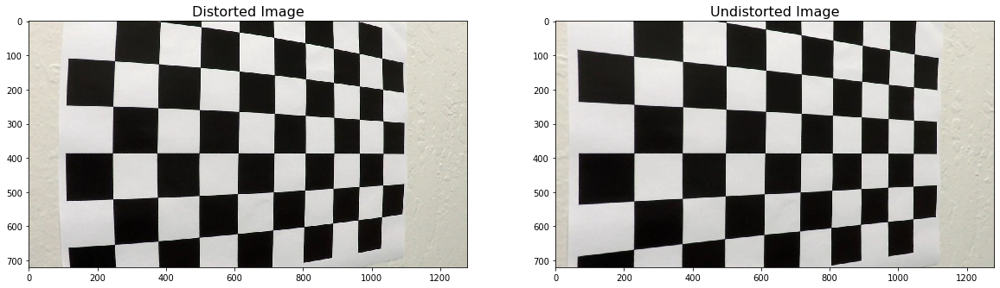

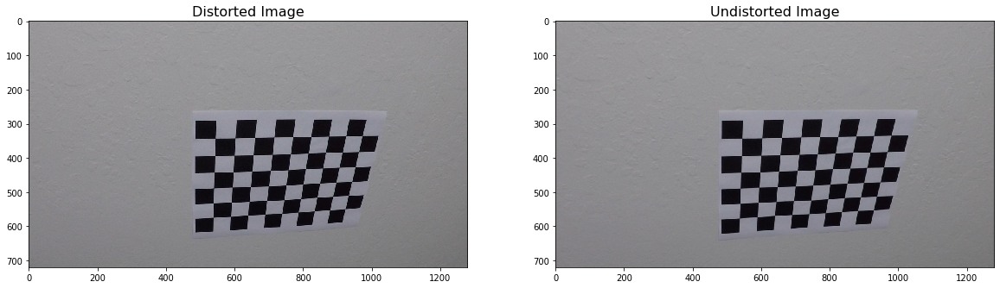

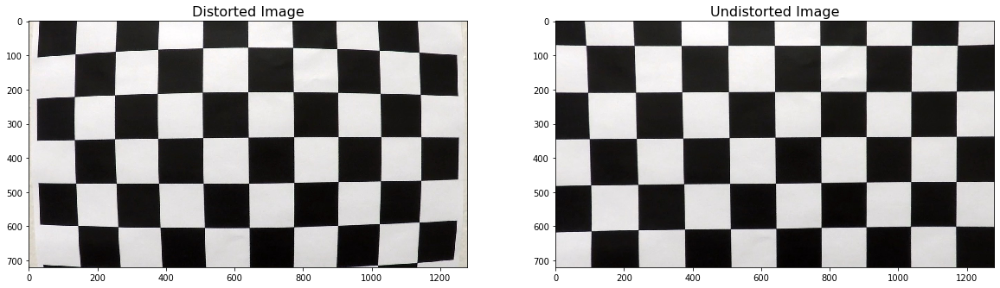

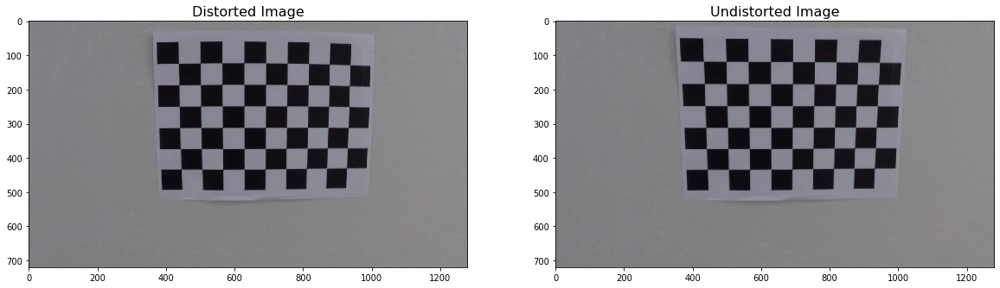

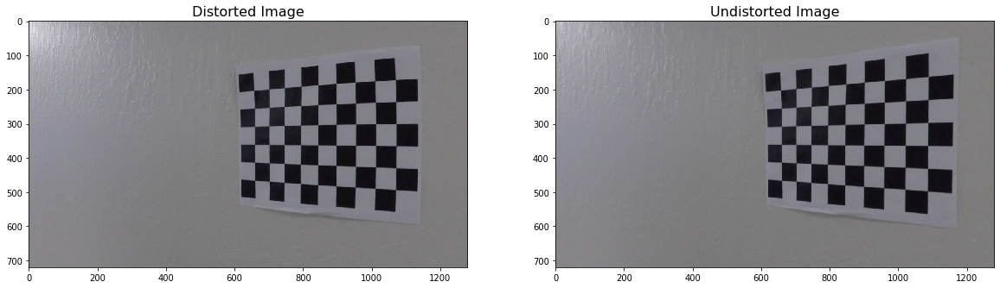

...

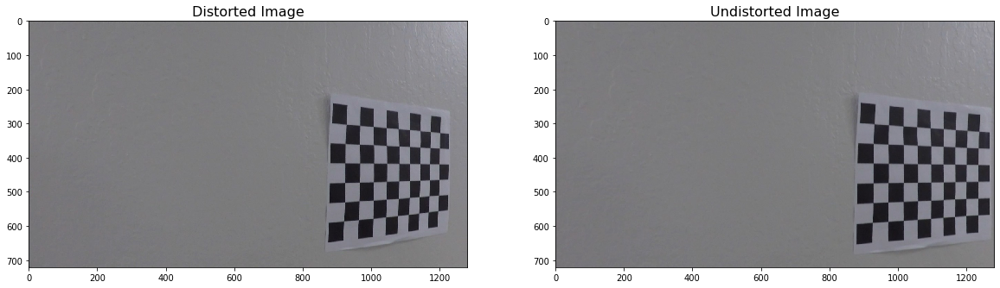

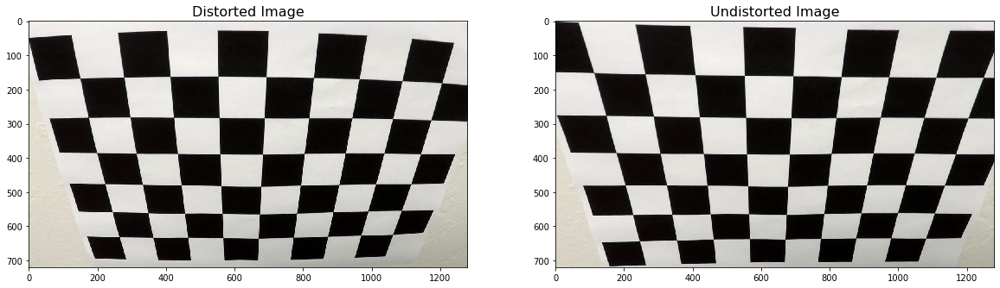

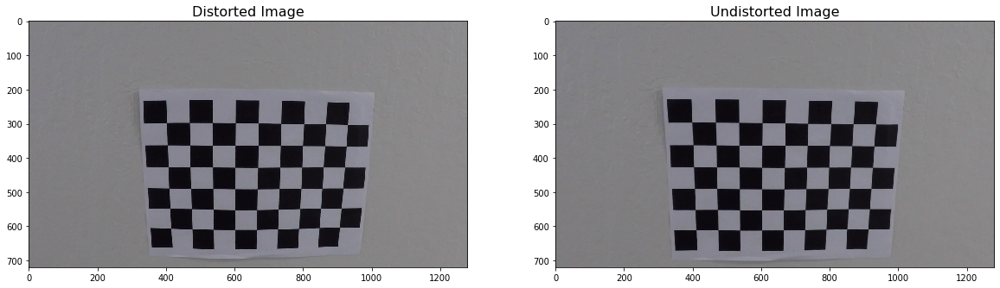

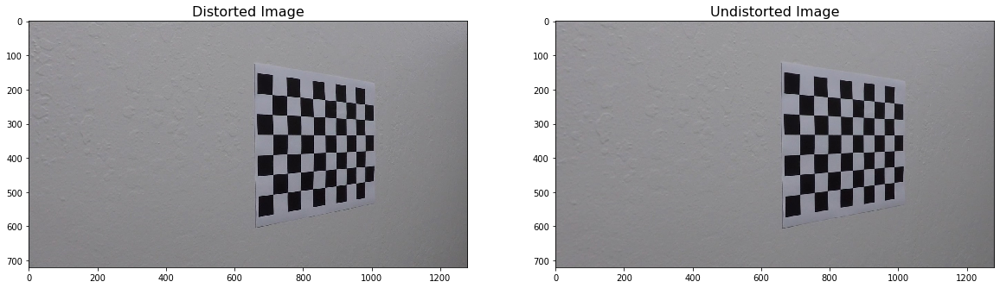

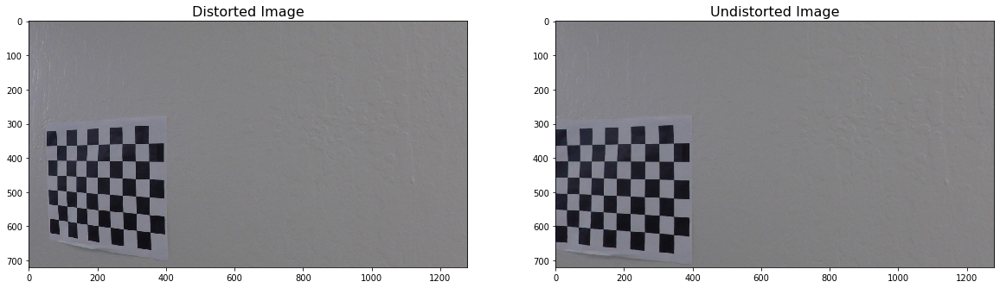

In [6]:
for fname in calibration_images:
    img = mpimg.imread(fname)
    undistorted_img = undistort_image(img, mtx, dist)
    plt_images(img, 'Distorted Image', undistorted_img, 'Undistorted Image')

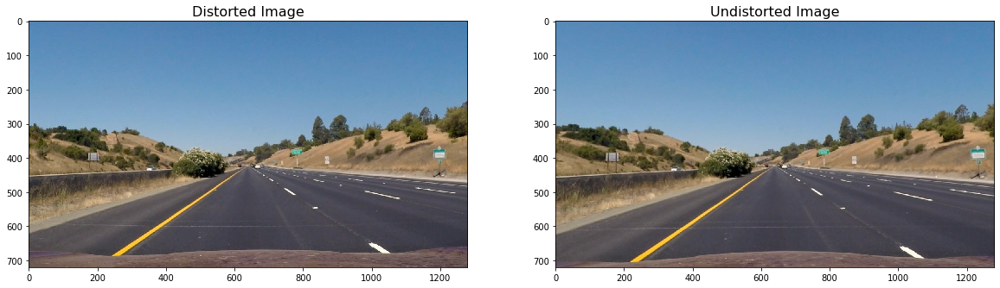

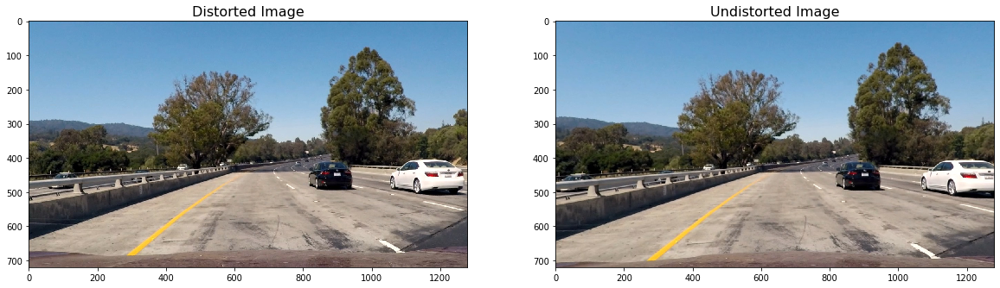

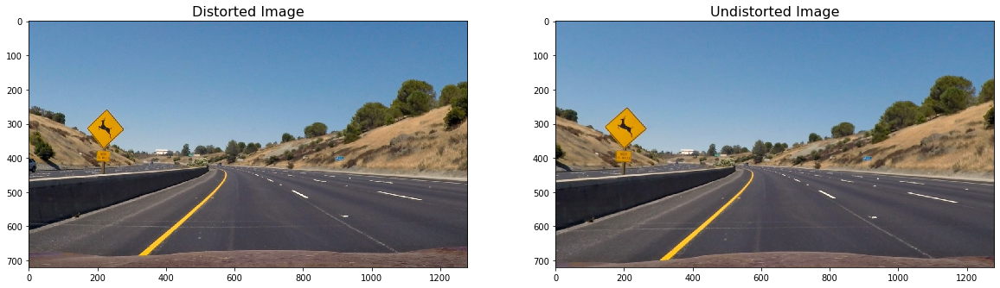

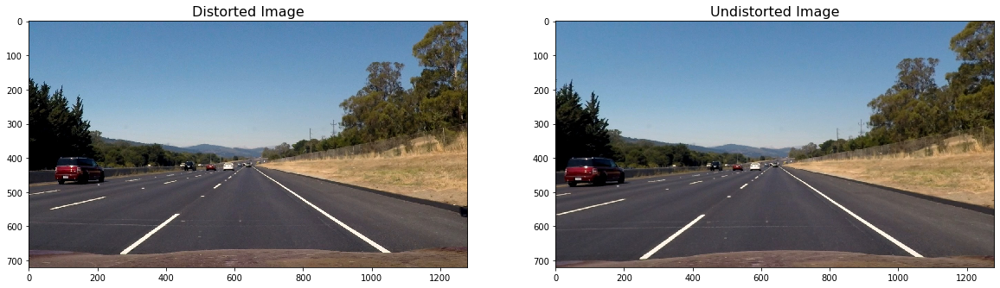

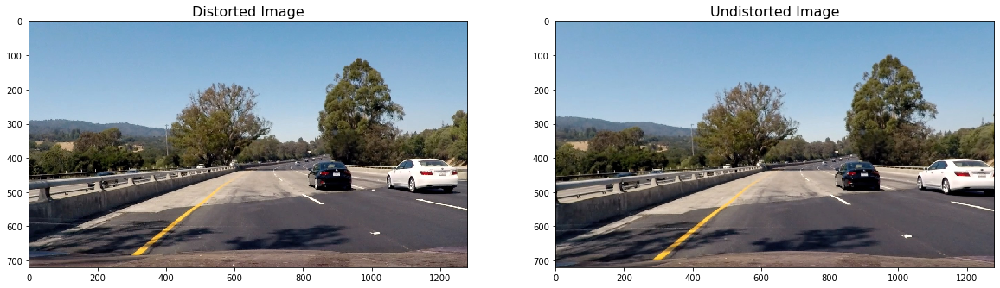

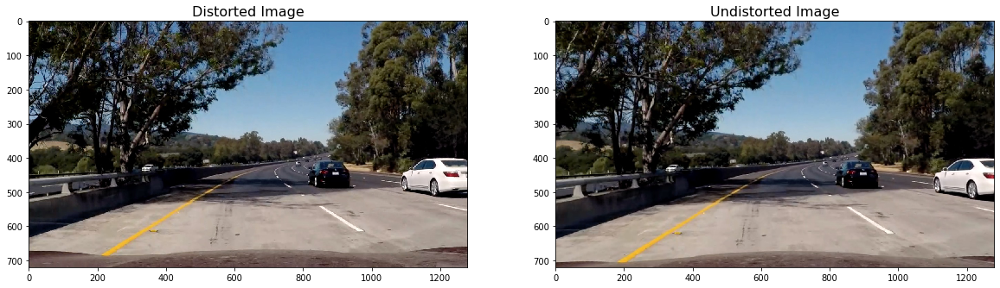

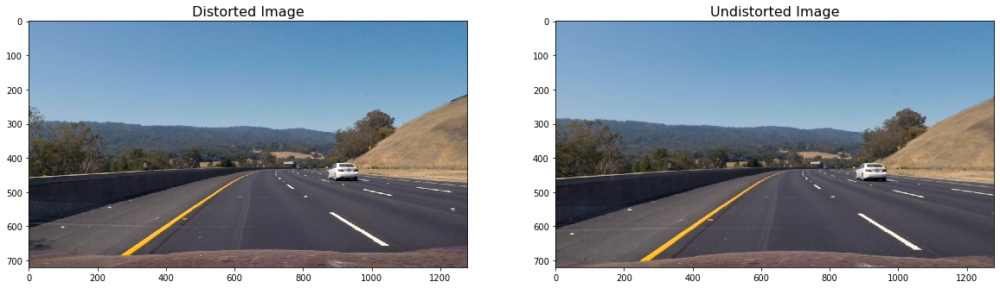

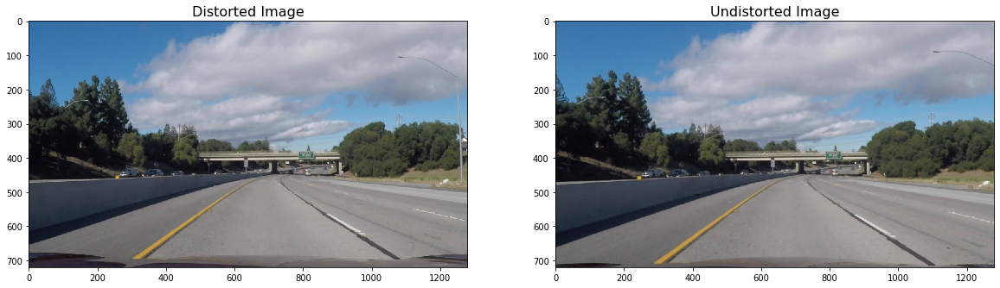

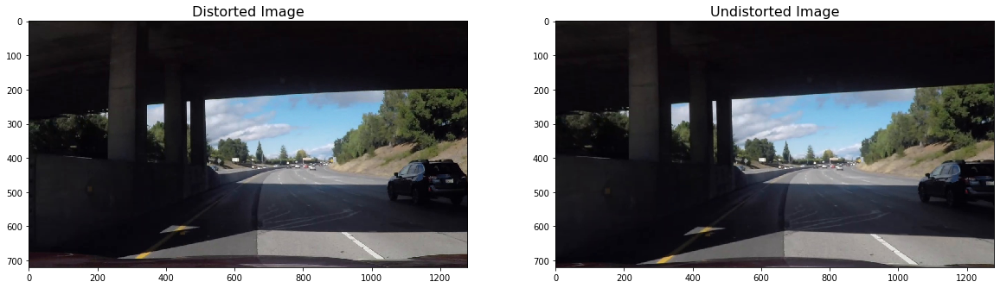

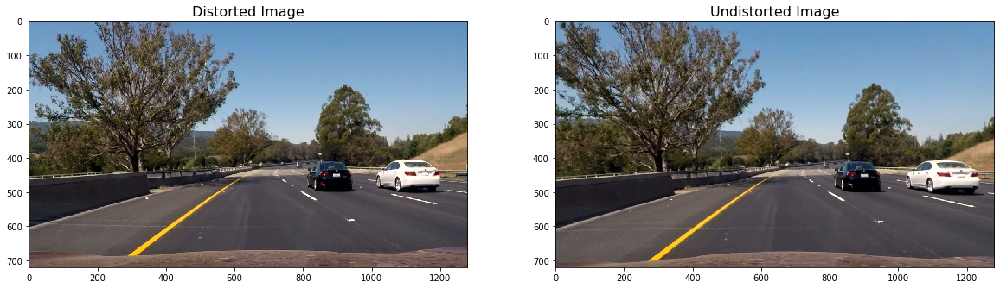

In [7]:
for fname in test_images:
    img = mpimg.imread(fname)
    undistorted_img = undistort_image(img, mtx, dist)
    plt_images(img, 'Distorted Image', undistorted_img, 'Undistorted Image')


# Find Current Lane

## Helper Functions

### Color Selection

In [8]:
def extract_white_hls(img):
    """
    Extracts all white pixels in HSL colorspace
    
    This function expects an image in the HSL format. Make sure
    you have converted your image to this colorspace. White pixels
    are extracted based on an upper and lower threshold. 
    """
    white_mask = cv2.inRange(img, config.lower_white, config.upper_white)
    return cv2.bitwise_and(img, img, mask = white_mask)

def extract_yellow_hls(img):
    """
    Extracts all yellow pixels in HSL colorspace
    
    This function expects an image in the HSL format. Make sure
    you have converted your image to this colorspace. Yellow pixels
    are extracted based on an upper and lower threshold. 
    """
    yellow_mask = cv2.inRange(img, config.lower_yellow, config.upper_yellow)
    return cv2.bitwise_and(img, img, mask = yellow_mask)

def color_selection(img):

    yellow_img = extract_yellow_hls(cv2.cvtColor(img, cv2.COLOR_RGB2HLS))
    temp = cv2.cvtColor(yellow_img, cv2.COLOR_HLS2RGB)
    gray_yellow=cv2.cvtColor(temp, cv2.COLOR_RGB2GRAY)

    yuv_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    yuv_planes = cv2.split(yuv_img)

    white_img = extract_white_hls(cv2.cvtColor(img, cv2.COLOR_RGB2HLS))
    temp = cv2.cvtColor(white_img, cv2.COLOR_HLS2RGB)
    gray_white=cv2.cvtColor(temp, cv2.COLOR_RGB2GRAY)
    
    yellow_filtered = np.zeros_like(yuv_planes[0])
    yellow_filtered[(yuv_planes[1] < config.yuv_u_threshold) | (gray_yellow > 0)] = 1
    yellow_filtered[:,640:] = 0 # use left side of yellow filtered
    
    white_filtered = np.zeros_like(yuv_planes[0])
    white_filtered[(gray_white > 0)] = 1
    white_filtered[:, :640] = 0 # use the right side of white filtered
    
    binary = white_filtered | yellow_filtered
    return binary

### Warp Image

In [9]:
def get_warp_coordinates(img):
    
    src_coordinates = np.float32(
            [[280,  img.shape[0]-20],  # Bottom left
             [595,  460],  # Top left
             [725,  460],  # Top right
             [1125, img.shape[0]-20]]) # Bottom right
        
    dst_coordinates = np.float32(
            [[250,  img.shape[0]],  # Bottom left
             [250,    0],  # Top left
             [1065,   0],  # Top right
             [1065, img.shape[0]]]) # Bottom right 
    return src_coordinates, dst_coordinates

def warp_image(img, src_coordinates, dst_coordinates):
    
    # calculate the perspective transform matrix and warp
    # the perspective to grab the screen
    M = cv2.getPerspectiveTransform(src_coordinates, dst_coordinates)
    warp = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_NEAREST)
    return warp

### Find Lane Borders

In [10]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 12
    # Set the width of the windows +/- margin
    margin = 120
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial_old(binary_warped):
    

    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Fit a second order polynomial to each
    left_fit_real = np.polyfit(lefty*config.ym_per_pix, leftx*config.xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*config.ym_per_pix, rightx*config.xm_per_pix, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    #cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    return color_warp, left_fit_real, right_fit_real    

### Metrics

In [11]:
def measure_radius_of_curvature(fit_cr, img):
    y_eval = img.shape[1] * config.ym_per_pix
    curverad = ((1 + (2*fit_cr[0]*y_eval*config.ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad

def measure_offset(img, left_fit, right_fit):
    x_max_real = img.shape[1]*config.xm_per_pix
    y_max_real = img.shape[0]*config.ym_per_pix
    
    vehicle_center = x_max_real / 2
    line_left = left_fit[0]*y_max_real**2 + left_fit[1]*y_max_real + left_fit[2]
    line_right = right_fit[0]*y_max_real**2 + right_fit[1]*y_max_real + right_fit[2]
    line_center = line_left + (line_right - line_left)/2
    offset = line_center - vehicle_center
    return offset

def add_metrics_old(img, left_fit, right_fit):
    
    # compute the radius of curvature
    left_curve_rad = measure_radius_of_curvature(left_fit, img)
    right_curve_rad = measure_radius_of_curvature(right_fit, img)
    average_overall_curve = (left_curve_rad + right_curve_rad)//2
    
    if average_overall_curve > 10000:
        average_overall_curve = "Straight Road"
    else:
        average_overall_curve = str(average_overall_curve) + "m"
    
    cv2.putText(img,"Radius of Curvature: " + average_overall_curve,\
                       (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
    offset = measure_offset(img, left_fit, right_fit)
    
    cv2.putText(img, "Center Offset: %.2f m" % offset,\
                (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

## Pipeline - Single Images

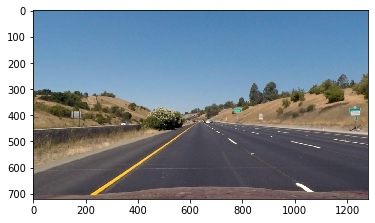

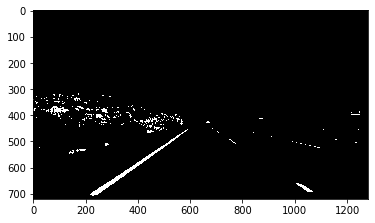

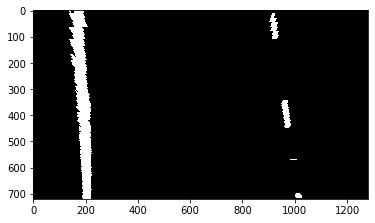

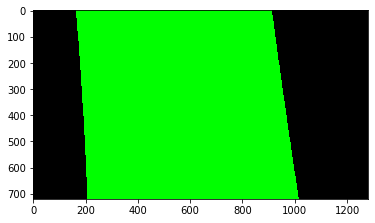

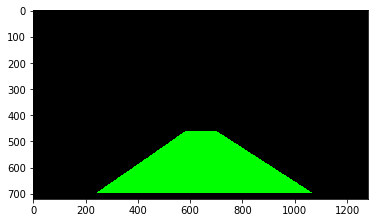

...

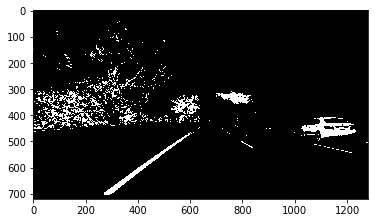

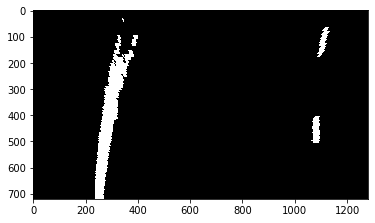

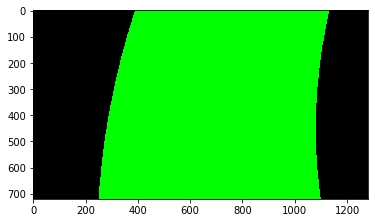

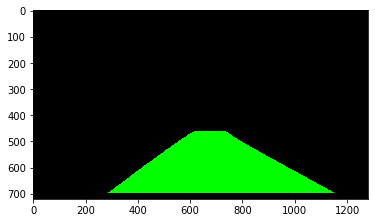

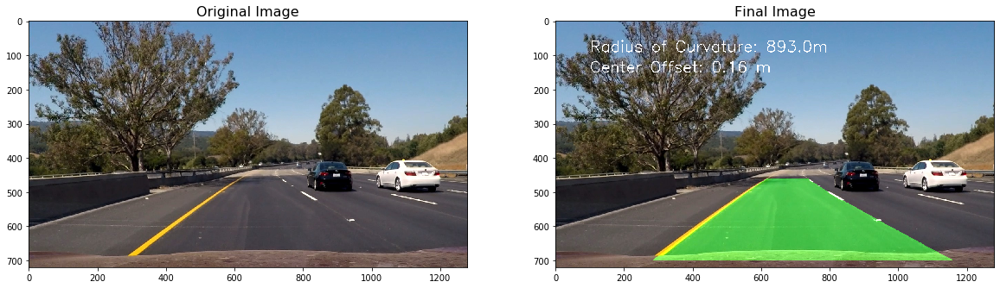

In [12]:
for fname in test_images:
    img = mpimg.imread(fname)

    undistorted_img = undistort_image(img, mtx, dist)
    
    plt.imshow(undistorted_img)
    plt.show()
    
    binary_color = color_selection(undistorted_img)
    
    plt.imshow(binary_color, cmap='gray')
    plt.show()
    
    src_coordinates, dst_coordinates = get_warp_coordinates(undistorted_img)
    warped_img = warp_image(binary_color, src_coordinates, dst_coordinates)
    
    plt.imshow(warped_img, cmap='gray')
    plt.show()
    
    warped_lanes_img, left_fit_real, right_fit_real = fit_polynomial_old(warped_img)
    
    plt.imshow(warped_lanes_img, cmap='gray')
    plt.show()
    
    unwarped_lanes_img = warp_image(warped_lanes_img, dst_coordinates, src_coordinates)
    
    plt.imshow(unwarped_lanes_img, cmap='gray')
    plt.show()
    
    annotated_img = cv2.addWeighted(img, 1, unwarped_lanes_img, 0.5, 0)
    
    add_metrics_old(annotated_img, left_fit_real, right_fit_real)
    
    plt_images(img, 'Original Image', annotated_img, 'Final Image')
    plt.show()
    

# Test Videos

## Lane Finding Pipeline for Videos

In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from  collections  import deque
from shapely.geometry import LineString
import warnings

""" Class for detecting lane boundaries of a video file
    This history is used to smooth
    the coefficients of the boundaries to avoid shakiness and
    detect high deviations.
"""
class ProcessVideo:
    def __init__(self, challenge=False, plot_start=0, plot_end=720, memory_size=5):
        self.history_left_lane_coeffs = deque(maxlen=memory_size)
        self.history_right_lane_coeffs = deque(maxlen=memory_size)
        self.history_left_lane_coeffs_real = deque(maxlen=memory_size)
        self.history_right_lane_coeffs_real = deque(maxlen=memory_size)
        self.history_curvature = deque(maxlen=memory_size)
        self.history_offset = deque(maxlen=memory_size)
        self.len_mem_size = memory_size
        self.curvature_prev_left = None
        self.curvature_prev_right = None
        self.img = None
        self.margin = 100
        self.prev_left_lane_coeffs = None
        self.prev_right_lane_coeffs = None
        self.failed_sanity = False
        self.solely_based_on_history = 0
        self.challenge = challenge
        self.plotly_start = plot_start
        self.plotly_end = plot_end

        
    def fit_polynomial(self, binary_warped):
        found_lines = False
      
        leftx, lefty, rightx, righty = None, None, None, None
        left_fit, right_fit, left_fit_real, right_fit_real = None, None, None, None
        left_fit = self.prev_left_lane_coeffs
        right_fit = self.prev_right_lane_coeffs
    
        if left_fit is not None \
            and right_fit is not None \
            and self.failed_sanity:
            
            nonzero = binary_warped.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
        
            left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - self.margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + self.margin)))
            right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - self.margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + self.margin)))
        
            # Again, extract left and right line pixel positions
            leftx = nonzerox[left_lane_inds]
            lefty = nonzeroy[left_lane_inds] 
            rightx = nonzerox[right_lane_inds]
            righty = nonzeroy[right_lane_inds]
            found_lines = leftx.size>0 and lefty.size>0 and rightx.size>0 and righty.size>0
            
        if not found_lines:
            # Find our lane pixels first
            leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
            found_lines = leftx.size>0 and lefty.size>0 and rightx.size>0 and righty.size>0
            
        if found_lines:
            # Fit a second order polynomial to each using `np.polyfit`
            left_fit = np.polyfit(lefty, leftx, 2)
            right_fit = np.polyfit(righty, rightx, 2)
            # Fit a second order polynomial to each
            left_fit_real = np.polyfit(lefty*config.ym_per_pix, leftx*config.xm_per_pix, 2)
            right_fit_real = np.polyfit(righty*config.ym_per_pix, rightx*config.xm_per_pix, 2)
        elif not self.history_left_lane_coeffs or not self.history_right_lane_coeffs:
            raise Exception("No Lines")

        ploty = np.linspace(self.plotly_start, self.plotly_end, binary_warped.shape[0])

        if found_lines:
            passed_sanity_checks = self.sanity_checks(left_fit_real, right_fit_real, \
                                                           left_fit, right_fit, ploty)
            self.failed_sanity = not passed_sanity_checks
            
        if not self.failed_sanity:
            if len(self.history_left_lane_coeffs) > 0:
                left_fit_hist, right_fit_hist, left_fit_real_hist, \
                    right_fit_real_hist = self.smooth_polynomials()
                left_fit = 0.9*left_fit + 0.1*left_fit_hist
                right_fit = 0.9*right_fit + 0.1*right_fit_hist
                left_fit_real = 0.9*left_fit_real + 0.1*left_fit_real_hist
                right_fit_real = 0.9*right_fit_real + 0.1*right_fit_real_hist
            self.solely_based_on_history = 0
            self.history_left_lane_coeffs.append(left_fit)
            self.history_right_lane_coeffs.append(right_fit)
            self.history_left_lane_coeffs_real.append(left_fit_real)
            self.history_right_lane_coeffs_real.append(right_fit_real)
            self.curvature_prev_left = measure_radius_of_curvature(left_fit_real, self.img)
            self.curvature_prev_right = measure_radius_of_curvature(right_fit_real, self.img)
            self.offset_prev = measure_offset(self.img, left_fit_real, right_fit_real)
            self.prev_left_lane_coeffs = left_fit
            self.prev_right_lane_coeffs = right_fit  
        else:
            if len(self.history_left_lane_coeffs) > 0:
                self.solely_based_on_history += 1
                if self.solely_based_on_history > 25:
                    self.history_left_lane_coeffs = deque(maxlen=self.len_mem_size)
                    self.history_right_lane_coeffs = deque(maxlen=self.len_mem_size)
                    self.history_left_lane_coeffs_real = deque(maxlen=self.len_mem_size)
                    self.history_right_lane_coeffs_real = deque(maxlen=self.len_mem_size)
                    self.history_curvature = deque(maxlen=self.len_mem_size)
                    self.history_offset = deque(maxlen=self.len_mem_size)
                    self.curvature_prev_left = None
                    self.curvature_prev_right = None
                    self.offset_prev = None
                    raise Exception("History too old!")
                left_fit, right_fit, left_fit_real, right_fit_real = self.smooth_polynomials()
            else:
                raise Exception("No Hist")
        
        # Generate x and y values for plotting
        left_fitx = None
        right_fitx = None
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))
        
        #cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        return color_warp, left_fit_real, right_fit_real
    
    def smooth_polynomials(self):
        smoothed_poly_left = np.mean(self.history_left_lane_coeffs, axis=0)
        smoothed_poly_right = np.mean(self.history_right_lane_coeffs, axis=0)
        smoothed_poly_left_real = np.mean(self.history_left_lane_coeffs_real, axis=0)
        smoothed_poly_right_real = np.mean(self.history_right_lane_coeffs_real, axis=0)
        return smoothed_poly_left, smoothed_poly_right, \
                smoothed_poly_left_real, smoothed_poly_right_real
    
    def sanity_checks(self, left_fit_real, right_fit_real, left_fit, right_fit, ploty):
        
        left_fitx = None
        right_fitx = None
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
            
        left_lineString = LineString([[x, y] for (x, y) in zip(left_fitx, ploty)])
        right_lineString = LineString([[x, y] for (x, y) in zip(right_fitx, ploty)])
            
        if left_lineString.intersects(right_lineString):
            return False
        
        if self.challenge:
            diff_top = abs(left_fitx[0] - right_fitx[0])
            if self.challenge and (diff_top < 250 or diff_top > 550):
                return False
            
        if self.curvature_prev_left and self.curvature_prev_right:
        
            left_curve_rad = measure_radius_of_curvature(left_fit_real, self.img)
            right_curve_rad = measure_radius_of_curvature(right_fit_real, self.img)
            offset = measure_offset(self.img, left_fit_real, right_fit_real)
        
            ## calculate change
            change = []
            change.append(np.abs(self.curvature_prev_left - left_curve_rad)/self.curvature_prev_left)
            change.append(np.abs(self.curvature_prev_right - right_curve_rad)/self.curvature_prev_right)
            change.append(np.abs(self.offset_prev - offset))


            if all([(change[0] < 30),(change[1] < 30), change[2] < 0.1]):
                self.curvature_prev_left = left_curve_rad
                self.curvature_prev_right = right_curve_rad
                self.offset_prev = offset
            
            return all([(change[0] < 30),(change[1] < 30), change[2] < 0.1])
        return True
    
    def add_metrics(self, img, left_fit, right_fit):
    
        # compute the radius of curvature
        left_curve_rad = measure_radius_of_curvature(left_fit, img)
        right_curve_rad = measure_radius_of_curvature(right_fit, img)
        average_overall_curve = (left_curve_rad + right_curve_rad)//2
        self.history_curvature.append(average_overall_curve)
        average_overall_curve = np.median(self.history_curvature)
    
        if average_overall_curve > 5000:
            average_overall_curve = "Straight Road"
        else:
            average_overall_curve = str(average_overall_curve) + "m"
    
        cv2.putText(img,"Radius of Curvature: " + average_overall_curve,\
                       (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
        offset = measure_offset(img, left_fit, right_fit)
        self.history_offset.append(offset)
        offset = np.median(self.history_offset)
    
        cv2.putText(img, "Center Offset: %.2f m" % offset,\
                (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

    def process_image(self, img):
        self.img = img
        annotated_img = None
        try:
            undistorted_img = undistort_image(img, mtx, dist)
            
            binary = color_selection(undistorted_img)
            
            src_coordinates, dst_coordinates = get_warp_coordinates(undistorted_img)
            warped_img = warp_image(binary, src_coordinates, dst_coordinates)
            
            warped_lanes_img, left_fit_real, right_fit_real = self.fit_polynomial(warped_img)
            
            unwarped_lanes_img = warp_image(warped_lanes_img, dst_coordinates, src_coordinates)
            
            annotated_img = cv2.addWeighted(undistorted_img, 1, unwarped_lanes_img, 0.5, 0)
    
            self.add_metrics(annotated_img, left_fit_real, right_fit_real)
        except Exception as e:
            warnings.warn(str(e))
            return img
        return annotated_img

## First Video - Easy

The pipeline works fine on this example.

In [14]:
pv_class = ProcessVideo(plot_end=710)

project_video_output = 'output_videos/project_video_output.mp4'
clip1 = VideoFileClip('test_videos/project_video.mp4')
project_video_clip = clip1.fl_image(pv_class.process_image)
%time project_video_clip.write_videofile(project_video_output, audio=False)

t:   0%|          | 2/1260 [00:00<01:14, 16.93it/s, now=None]

Moviepy - Building video output_videos/project_video_output.mp4.
Moviepy - Writing video output_videos/project_video_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos/project_video_output.mp4
CPU times: user 6min 14s, sys: 7.3 s, total: 6min 22s
Wall time: 3min 1s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

## Second Video - Challenging

The pipeline works in most cases. It fails in the tunnel section. In this section the lane borders are calculated based on the previous frames.

In [16]:
pv_class = ProcessVideo(challenge=True, plot_start=150, plot_end=715)

video_challenge_output = 'output_videos/challenge_video_output.mp4'
clip2 = VideoFileClip('test_videos/challenge_video.mp4')
challenge_video_clip = clip2.fl_image(pv_class.process_image)
%time challenge_video_clip.write_videofile(video_challenge_output, audio=False)

t:   0%|          | 2/485 [00:00<00:32, 14.88it/s, now=None]

Moviepy - Building video output_videos/challenge_video_output.mp4.
Moviepy - Writing video output_videos/challenge_video_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos/challenge_video_output.mp4
CPU times: user 2min 18s, sys: 3.1 s, total: 2min 21s
Wall time: 1min 13s


In [17]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_challenge_output))

## Third Video - Extremely Difficult

Pipeline performs very poorly on this example. 

In [18]:
pv_class = ProcessVideo(challenge=True)

video_harder_output = 'output_videos/harder_challenge_video_output.mp4'
clip3 = VideoFileClip('test_videos/harder_challenge_video.mp4')
harder_video_clip = clip3.fl_image(pv_class.process_image)
%time harder_video_clip.write_videofile(video_harder_output, audio=False)

t:   0%|          | 2/1199 [00:00<01:00, 19.93it/s, now=None]

Moviepy - Building video output_videos/harder_challenge_video_output.mp4.
Moviepy - Writing video output_videos/harder_challenge_video_output.mp4



Moviepy - Done !
Moviepy - video ready output_videos/harder_challenge_video_output.mp4
CPU times: user 6min 7s, sys: 15.8 s, total: 6min 23s
Wall time: 3min 18s


In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_harder_output))